In [ ]:
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout
from keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from keras.utils import to_categorical
from keras.regularizers import l2

# Load the data
df_15 = pd.read_csv("/content/15x15_data (3).csv")


In [ ]:
df_15.head()

,0,1,2,3,4,5,6,7,8,9,...,224,225,226,227,228,Month,Name,Day,Class,Label
0,0.215782,0.216164,0.217243,0.217349,0.218306,0.217968,0.217241,0.215128,0.213058,0.210526,...,0.259653,0,0,1,0,12,2917_c2_cp2_66_11,2917,0,CL
1,0.190453,0.191821,0.193863,0.195419,0.197259,0.198331,0.199015,0.198428,0.197349,0.196754,...,0.224903,0,1,1,0,12,2910_c1_cp1_98_18,2910,0,CL
2,0.162689,0.162123,0.162202,0.161306,0.161527,0.161512,0.160591,0.159627,0.158076,0.156911,...,0.151062,0,1,1,0,12,2908_c1_cp1_79_13,2908,0,CL
3,0.330736,0.324732,0.319045,0.313353,0.309349,0.304369,0.299015,0.292240,0.285714,0.279882,...,0.329151,0,0,0,0,12,2908_c4_cp2_21_20,2908,0,CL
4,0.149050,0.149464,0.150511,0.151559,0.152227,0.153166,0.153202,0.152750,0.152185,0.151500,...,0.154440,0,1,1,0,12,2907_c1_cp1_76_13,2907,0,CL


In [ ]:
df_15.shape

(2149, 234)

In [ ]:
df_15.columns

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '224', '225', '226', '227', '228', 'Month', 'Name', 'Day', 'Class',
       'Label'],
      dtype='object', length=234)

In [ ]:

# Split the data into train and test sets

train_df_15 = pd.concat([df_15[df_15["Day"] <= 1095], df_15[(df_15["Day"] > 1460) & (df_15["Day"] <= 2555)], df_15[(df_15["Day"] > 2920) & (df_15["Day"] <= 3285)]])

test_df_15 = pd.concat([df_15[(df_15["Day"] > 1095) & (df_15["Day"] <= 1460)], df_15[(df_15["Day"] > 2555) & (df_15["Day"] <= 2920)], df_15[df_15["Day"] > 3285]])
train_df_15.reset_index(drop=True, inplace=True)

test_df_15.reset_index(drop = True, inplace = True)


In [ ]:

# Prepare train and test data
X_train_15 = train_df_15.drop(columns=[ "Name", "Day", "Class", "Label"]).values
Y_train_15 = train_df_15["Class"].values

X_test_15 = test_df_15.drop(columns=[ "Name", "Day", "Class", "Label"]).values
Y_test_15 = test_df_15["Class"].values

Y_train_15 = to_categorical(Y_train_15, num_classes=4)


In [ ]:
from keras.layers import Input, Dense, BatchNormalization, Dropout
from keras.models import Model

# Define the input layer
inputs = Input(shape=(X_train_15.shape[1],))

# Add Batch Normalization for input data
x = BatchNormalization()(inputs)

# Add multiple dense layers with dropout and batch normalization
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

x = Dense(64, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

x = Dense(32, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

# Output layer
outputs = Dense(4, activation='softmax')(x)

# Create model
dnn_model_structured = Model(inputs=inputs, outputs=outputs)

# Compile the model
dnn_model_structured.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
dnn_model_structured.summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 225)]             0         
                                                                 
 batch_normalization_8 (Bat  (None, 225)               900       
 chNormalization)                                                
                                                                 
 dense_13 (Dense)            (None, 128)               28928     
                                                                 
 batch_normalization_9 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_14 (Dense)            (None, 64)                8256

In [ ]:

# Define the model architecture
dnn_model_15 = Sequential()
dnn_model_15.add(Dense(64, activation="relu", input_shape=(X_train_15.shape[1],)))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(32, activation="relu", kernel_regularizer=l2(0.02)))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(16, activation="relu", kernel_regularizer=l2(0.02)))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(4, activation="softmax"))


In [ ]:

# Compile the model
dnn_model_15.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [ ]:

# Early stopping
early_stopping = EarlyStopping(monitor='loss', patience=50)


In [ ]:
# Fit the model
history = dnn_model_structured.fit(X_train_15, Y_train_15, epochs=1000, batch_size=16, callbacks=[early_stopping], validation_data=(X_test_15, Y_test_15))


Epoch 1/1000
26/26 [==============================] - ETA: 0s - loss: 1.8930 - accuracy: 0.3060

ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2066, in test_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2049, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2037, in run_step  **
        outputs = model.test_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1919, in test_step
        self.compute_loss(x, y, y_pred, sample_weight)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 2221, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/backend.py", line 5573, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 1) and (None, 4) are incompatible


In [ ]:
# Make predictions
y_15_pred_dnn = dnn_model_15.predict(X_test_15).argmax(axis=1)
accuracy_15_dnn = accuracy_score(Y_test_15, y_15_pred_dnn)
conf_15_dnn = confusion_matrix(Y_test_15, y_15_pred_dnn)
precision_15_dnn = precision_score(Y_test_15, y_15_pred_dnn, average='macro')
recall_15_dnn = recall_score(Y_test_15, y_15_pred_dnn, average='macro')
f1_score_15_dnn = f1_score(Y_test_15, y_15_pred_dnn, average='macro')


10/10 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print("DNN:")
print(f"Precision: {precision_15_dnn}")
print(f"Recall: {recall_15_dnn}")
print(f"F1 Score: {f1_score_15_dnn}")
print("Accuracy:", accuracy_15_dnn)
print("Confusion Matrix:\n", conf_15_dnn)

DNN:
Precision: 0.48468013468013466
Recall: 0.41693979389966634
F1 Score: 0.36280230203899433
Accuracy: 0.5796178343949044
Confusion Matrix:
 [[ 41 118   0]
 [  1 141   0]
 [  2  11   0]]


In [ ]:
import pandas as pd
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

# Assuming you have already loaded your data into df_15

# Define train and test sets
train_df_15 = pd.concat([df_15[df_15["Day"] <= 1095], df_15[(df_15["Day"] > 1460) & (df_15["Day"] <= 2555)], df_15[(df_15["Day"] > 2920) & (df_15["Day"] <= 3285)]])
test_df_15 = pd.concat([df_15[(df_15["Day"] > 1095) & (df_15["Day"] <= 1460)], df_15[(df_15["Day"] > 2555) & (df_15["Day"] <= 2920)], df_15[df_15["Day"] > 3285]])

train_df_15.reset_index(drop=True, inplace=True)
test_df_15.reset_index(drop=True, inplace=True)

# Prepare train and test data
X_train_15 = train_df_15.drop(columns=["Name", "Day", "Class", "Label"]).values
Y_train_15 = train_df_15["Class"].values

X_test_15 = test_df_15.drop(columns=["Name", "Day", "Class", "Label"]).values
Y_test_15 = test_df_15["Class"].values

Y_train_15 = to_categorical(Y_train_15, num_classes=4)

# Define the model architecture
dnn_model_15 = Sequential()
dnn_model_15.add(Dense(128, activation="relu", input_shape=(X_train_15.shape[1],)))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(64, activation="relu"))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(32, activation="relu"))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(4, activation="softmax"))

# Compile the model
dnn_model_15.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)

# Fit the model
history = dnn_model_15.fit(X_train_15, Y_train_15, epochs=1000, batch_size=16, callbacks=[early_stopping], validation_data=(X_test_15, to_categorical(Y_test_15, num_classes=4)))

# Evaluate the model on test data
loss, accuracy = dnn_model_15.evaluate(X_test_15, to_categorical(Y_test_15, num_classes=4))
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)


Epoch 1/1000
26/26 [==============================] - 4s 40ms/step - loss: 1.1873 - accuracy: 0.4652 - val_loss: 1.0057 - val_accuracy: 0.5032
Epoch 2/1000
26/26 [==============================] - 0s 11ms/step - loss: 1.0395 - accuracy: 0.5075 - val_loss: 0.9280 - val_accuracy: 0.5382
Epoch 3/1000
26/26 [==============================] - 0s 9ms/step - loss: 0.9424 - accuracy: 0.5473 - val_loss: 0.9213 - val_accuracy: 0.5064
Epoch 4/1000
26/26 [==============================] - 0s 13ms/step - loss: 0.9637 - accuracy: 0.5025 - val_loss: 0.9209 - val_accuracy: 0.5318
Epoch 5/1000
26/26 [==============================] - 0s 10ms/step - loss: 0.9534 - accuracy: 0.5050 - val_loss: 0.9192 - val_accuracy: 0.5064
Epoch 6/1000
26/26 [==============================] - 0s 12ms/step - loss: 0.9162 - accuracy: 0.5149 - val_loss: 0.8814 - val_accuracy: 0.5064
Epoch 7/1000
26/26 [==============================] - 0s 13ms/step - loss: 0.8604 - accuracy: 0.5000 - val_loss: 0.8755 - val_accuracy: 0.5732


In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Predict class labels for test set
Y_pred = np.argmax(dnn_model_15.predict(X_test_15), axis=1)

# Generate confusion matrix
conf_matrix = confusion_matrix(Y_test_15, Y_pred)

print("Confusion Matrix:")
print(conf_matrix)


10/10 [==============================] - 0s 4ms/step
Confusion Matrix:
[[152   7   0]
 [ 43  99   0]
 [ 11   2   0]]


In [ ]:
from keras.callbacks import TensorBoard
import time

# Define the model architecture
dnn_model_15 = Sequential()
dnn_model_15.add(Dense(128, activation="relu", input_shape=(X_train_15.shape[1],)))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(64, activation="relu"))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(32, activation="relu"))
dnn_model_15.add(Dropout(0.4))
dnn_model_15.add(Dense(4, activation="softmax"))

# Compile the model
dnn_model_15.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Define TensorBoard callback
log_dir = "logs/fit/" + time.strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)

# Fit the model with TensorBoard callback
history = dnn_model_15.fit(X_train_15, Y_train_15, epochs=1000, batch_size=16, callbacks=[early_stopping, tensorboard_callback], validation_data=(X_test_15, to_categorical(Y_test_15, num_classes=4)))

# Evaluate the model on test data
loss, accuracy = dnn_model_15.evaluate(X_test_15, to_categorical(Y_test_15, num_classes=4))
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)


Epoch 1/1000
26/26 [==============================] - 2s 19ms/step - loss: 1.2289 - accuracy: 0.4279 - val_loss: 0.9256 - val_accuracy: 0.4522
Epoch 2/1000
26/26 [==============================] - 0s 10ms/step - loss: 1.0393 - accuracy: 0.4428 - val_loss: 0.9223 - val_accuracy: 0.4873
Epoch 3/1000
26/26 [==============================] - 0s 11ms/step - loss: 0.9558 - accuracy: 0.4900 - val_loss: 0.8923 - val_accuracy: 0.4522
Epoch 4/1000
26/26 [==============================] - 0s 10ms/step - loss: 0.9260 - accuracy: 0.4801 - val_loss: 0.8831 - val_accuracy: 0.5000
Epoch 5/1000
26/26 [==============================] - 0s 11ms/step - loss: 0.8823 - accuracy: 0.5323 - val_loss: 0.8831 - val_accuracy: 0.5446
Epoch 6/1000
26/26 [==============================] - 0s 10ms/step - loss: 0.8861 - accuracy: 0.5050 - val_loss: 0.8805 - val_accuracy: 0.5764
Epoch 7/1000
26/26 [==============================] - 0s 10ms/step - loss: 0.9013 - accuracy: 0.4801 - val_loss: 0.8883 - val_accuracy: 0.5064

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

In [ ]:
12,1(coh-col & cl) -- with the days

In [ ]:
# Predict classes on the test set

Y_pred_15 = dnn_model_15.predict(X_test_15)
predicted_classes = np.argmax(Y_pred_15, axis=1)

# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test_15, predicted_classes)

# Get the indices of misclassified samples
misclassified_indices = np.where(Y_test_15 != predicted_classes)[0]

# Get the corresponding days for misclassified samples
misclassified_days = test_df_15.iloc[misclassified_indices]["Day"]

# Print misclassified days and their corresponding predicted and true classes
for day, predicted_class, true_class in zip(misclassified_days, predicted_classes[misclassified_indices], Y_test_15[misclassified_indices]):
    print(f"Day {day}: Predicted Class {predicted_class}, True Class {true_class}")


32/32 [==============================] - 0s 2ms/step
Day 1431: Predicted Class 0, True Class 2
Day 1410: Predicted Class 2, True Class 3
Day 1396: Predicted Class 1, True Class 2
Day 1373: Predicted Class 1, True Class 2
Day 1368: Predicted Class 1, True Class 2
Day 1359: Predicted Class 0, True Class 2
Day 1346: Predicted Class 1, True Class 2
Day 1343: Predicted Class 0, True Class 2
Day 1343: Predicted Class 0, True Class 2
Day 1339: Predicted Class 2, True Class 3
Day 1339: Predicted Class 1, True Class 3
Day 1339: Predicted Class 1, True Class 3
Day 1331: Predicted Class 1, True Class 2
Day 1330: Predicted Class 1, True Class 2
Day 1327: Predicted Class 1, True Class 2
Day 1324: Predicted Class 0, True Class 2
Day 1313: Predicted Class 0, True Class 2
Day 1312: Predicted Class 0, True Class 2
Day 1312: Predicted Class 1, True Class 2
Day 1310: Predicted Class 1, True Class 2
Day 1308: Predicted Class 1, True Class 2
Day 1307: Predicted Class 1, True Class 2
Day 1306: Predicted Cla

In [ ]:
from tabulate import tabulate

# Create a list of misclassified samples and their details
misclassified_data = []
for day, predicted_class, true_class in zip(misclassified_days, predicted_classes[misclassified_indices], Y_test_15[misclassified_indices]):
    misclassified_data.append([day, predicted_class, true_class])

# Display the misclassified samples in a table format
headers = ["Day", "Predicted Class", "True Class"]
print(tabulate(misclassified_data, headers=headers))


  Day    Predicted Class    True Class
-----  -----------------  ------------
 1431                  0             2
 1410                  2             3
 1396                  1             2
 1373                  1             2
 1368                  1             2
 1359                  0             2
 1346                  1             2
 1343                  0             2
 1343                  0             2
 1339                  2             3
 1339                  1             3
 1339                  1             3
 1331                  1             2
 1330                  1             2
 1327                  1             2
 1324                  0             2
 1313                  0             2
 1312                  0             2
 1312                  1             2
 1310                  1             2
 1308                  1             2
 1307                  1             2
 1306                  1             2
 1305                  2 

In [ ]:
# Filter misclassified days where the true class is 1
misclassified_days_true_class_1 = misclassified_days[Y_test_15[misclassified_indices] == 1]

# Print the misclassified days and their corresponding predicted and true classes
print("Misclassified Days where True Class is 1:")
for day, predicted_class, true_class in zip(misclassified_days_true_class_1, predicted_classes[misclassified_indices], Y_test_15[misclassified_indices]):
    print(f"Day {day}: Predicted Class {predicted_class}, True Class {true_class}")


Misclassified Days where True Class is 1:
Day 1303: Predicted Class 0, True Class 2
Day 1300: Predicted Class 2, True Class 3
Day 2862: Predicted Class 1, True Class 2
Day 2838: Predicted Class 1, True Class 2
Day 2836: Predicted Class 1, True Class 2
Day 2762: Predicted Class 0, True Class 2
Day 2722: Predicted Class 1, True Class 2
Day 3612: Predicted Class 0, True Class 2
Day 3529: Predicted Class 0, True Class 2
Day 3519: Predicted Class 2, True Class 3
Day 3518: Predicted Class 1, True Class 3
Day 3468: Predicted Class 1, True Class 3


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Provided data
data = [
    [1431, 0, 2], [1410, 2, 3], [1396, 1, 2], [1373, 1, 2], [1368, 1, 2], [1359, 0, 2],
    [1346, 1, 2], [1343, 0, 2], [1343, 0, 2], [1339, 2, 3], [1339, 1, 3], [1339, 1, 3],
    [1331, 1, 2], [1330, 1, 2], [1327, 1, 2], [1324, 0, 2], [1313, 0, 2], [1312, 0, 2],
    [1312, 1, 2], [1310, 1, 2], [1308, 1, 2], [1307, 1, 2], [1306, 1, 2], [1305, 2, 3],
    [1304, 0, 2], [1303, 2, 1], [1302, 2, 0], [1300, 2, 1], [1296, 1, 3], [1287, 1, 2],
    [1284, 1, 2], [1282, 1, 2], [1272, 0, 2], [1272, 2, 3], [1255, 0, 2], [1250, 0, 3],
    [1249, 0, 2], [1230, 2, 0], [1212, 0, 2], [1211, 0, 2], [1210, 0, 2], [1209, 0, 2],
    [1208, 0, 2], [1205, 0, 2], [1198, 2, 3], [1148, 2, 3], [1106, 0, 3], [2901, 0, 3],
    [2899, 0, 2], [2898, 0, 2], [2862, 0, 1], [2851, 1, 3], [2848, 1, 2], [2840, 0, 2],
    [2838, 2, 1], [2836, 2, 1], [2829, 2, 0], [2823, 1, 2], [2818, 0, 2], [2807, 1, 2],
    [2807, 1, 3], [2804, 1, 2], [2803, 1, 2], [2802, 1, 2], [2802, 1, 2], [2801, 1, 2],
    [2801, 1, 3], [2801, 2, 0], [2791, 1, 2], [2787, 1, 2], [2785, 1, 3], [2784, 1, 2],
    [2783, 1, 2], [2783, 1, 2], [2782, 1, 2], [2776, 1, 2], [2774, 1, 3], [2763, 2, 0],
    [2763, 1, 2], [2762, 2, 0], [2762, 0, 1], [2760, 1, 3], [2752, 1, 3], [2747, 1, 3],
    [2745, 2, 0], [2745, 1, 3], [2745, 1, 3], [2736, 2, 0], [2722, 1, 0], [2722, 0, 1],
    [2700, 0, 2], [2678, 0, 2], [2677, 0, 2], [2675, 0, 2], [2674, 0, 2], [2672, 0, 2],
    [2672, 0, 3], [2667, 0, 2], [2666, 0, 2], [2665, 0, 2], [2664, 0, 2], [2620, 0, 3],
    [3647, 0, 2], [3647, 0, 2], [3642, 0, 2], [3642, 0, 2], [3633, 0, 2], [3630, 0, 2],
    [3623, 0, 2], [3622, 0, 2], [3621, 0, 2], [3612, 2, 1], [3602, 1, 3], [3591, 0, 2], [3590, 0, 2], [3589, 0, 2],
    [3570, 0, 3], [3558, 2, 3], [3549, 1, 3], [3548, 0, 2], [3547, 1, 3], [3544, 0, 2],
    [3543, 0, 2], [3538, 1, 3], [3536, 2, 3], [3535, 2, 3], [3534, 2, 0], [3533, 2, 0],
    [3529, 2, 1], [3528, 2, 3], [3527, 1, 3], [3526, 2, 3], [3526, 1, 3], [3525, 1, 3],
    [3523, 1, 3], [3522, 1, 3], [3520, 2, 3], [3520, 1, 3], [3519, 2, 1], [3518, 2, 1],
    [3517, 2, 3], [3516, 1, 3], [3516, 2, 3], [3515, 2, 3], [3514, 2, 3], [3513, 1, 3],
    [3512, 0, 2], [3509, 1, 3], [3509, 2, 3], [3507, 2, 3], [3506, 2, 3], [3506, 0, 2],
    [3505, 2, 3], [3505, 1, 3], [3502, 2, 3], [3501, 1, 3], [3501, 2, 3], [3501, 2, 0],
    [3500, 2, 0], [3499, 2, 0], [3498, 2, 0], [3497, 2, 0], [3496, 2, 0], [3495, 2, 0],
    [3494, 2, 0], [3493, 2, 0], [3492, 2, 3], [3490, 1, 3], [3490, 2, 3], [3489, 2, 3],
    [3489, 1, 3], [3488, 2, 3], [3487, 2, 3], [3487, 2, 3], [3487, 1, 3], [3486, 0, 2],
    [3486, 2, 3], [3486, 2, 3], [3486, 1, 3], [3485, 1, 3], [3485, 1, 3], [3484, 2, 3],
    [3483, 1, 3], [3479, 1, 3], [3478, 0, 3], [3475, 2, 0], [3469, 2, 0], [3469, 2, 3],
    [3468, 2, 0], [3468, 2, 1], [3465, 1, 3], [3461, 1, 3], [3457, 2, 3], [3454, 2, 3],
    [3453, 2, 3], [3453, 1, 3], [3453, 2, 3], [3452, 2, 3], [3451, 2, 0], [3450, 1, 0],
    [3447, 1, 3], [3446, 1, 3], [3443, 2, 3], [3442, 2, 3], [3439, 0, 2], [3438, 0, 2],
    [3437, 0, 3], [3437, 0, 2], [3437, 0, 2], [3437, 0, 2], [3436, 2, 3], [3431, 2, 3],
    [3419, 0, 2], [3418, 0, 2], [3401, 0, 2], [3401, 0, 2], [3400, 0, 2], [3400, 0, 2],
    [3399, 0, 2], [3399, 0, 2], [3398, 0, 2], [3394, 0, 3], [3391, 0, 2], [3384, 0, 2], [3382, 0, 2], [3381, 0, 2], [3381, 1, 3],
    [3380, 0, 2], [3380, 0, 2], [3379, 0, 2], [3378, 0, 2], [3377, 0, 2], [3376, 0, 2],
    [3353, 0, 2], [3350, 0, 3], [3296, 0, 3]
]


      Day  Predicted Class  True Class
0    1431                0           2
1    1410                2           3
2    1396                1           2
3    1373                1           2
4    1368                1           2
..    ...              ...         ...
231  3377                0           2
232  3376                0           2
233  3353                0           2
234  3350                0           3
235  3296                0           3

[236 rows x 3 columns]


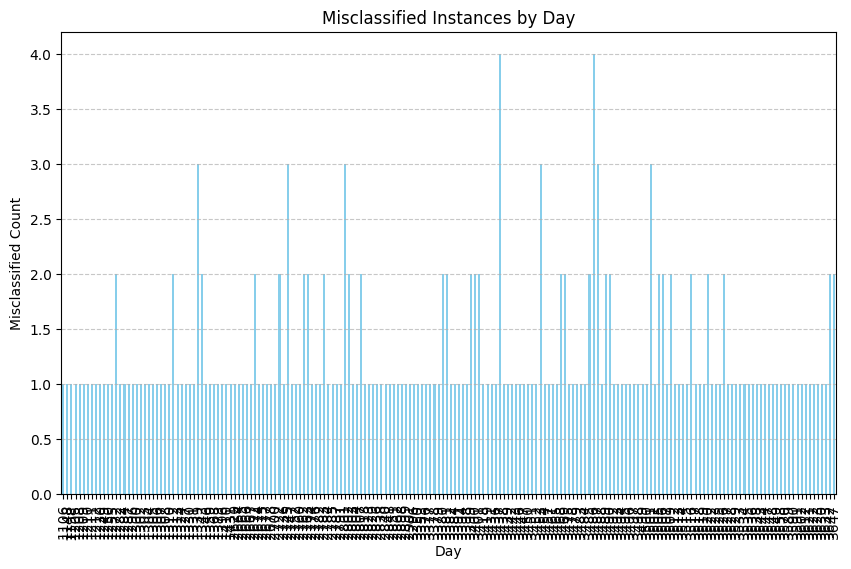

In [ ]:
import matplotlib.pyplot as plt

# Count the occurrences of each true class in the misclassified samples
misclassified_counts = misclassified_days.value_counts().sort_index()

# Plotting the misclassified instances
plt.figure(figsize=(10, 6))
misclassified_counts.plot(kind='bar', color='skyblue')
plt.title('Misclassified Instances by Day')
plt.xlabel('Day')
plt.ylabel('Misclassified Count')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


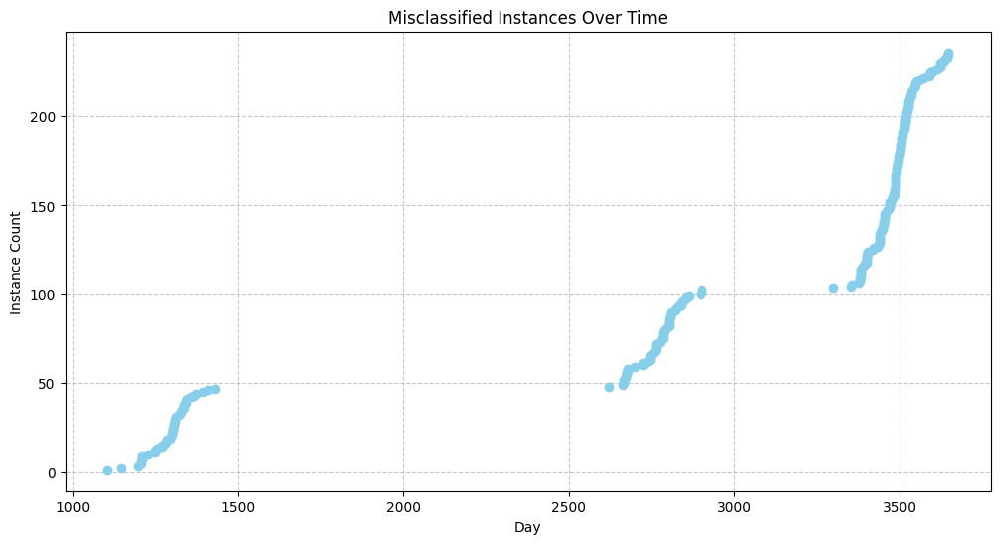

In [ ]:
import matplotlib.pyplot as plt

# Sorting misclassified_days in ascending order
misclassified_days_sorted = misclassified_days.sort_values()

# Creating a line plot
plt.figure(figsize=(12, 6))
plt.plot(misclassified_days_sorted, range(1, len(misclassified_days_sorted) + 1), marker='o', linestyle='', color='skyblue')
plt.title('Misclassified Instances Over Time')
plt.xlabel('Day')
plt.ylabel('Instance Count')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()



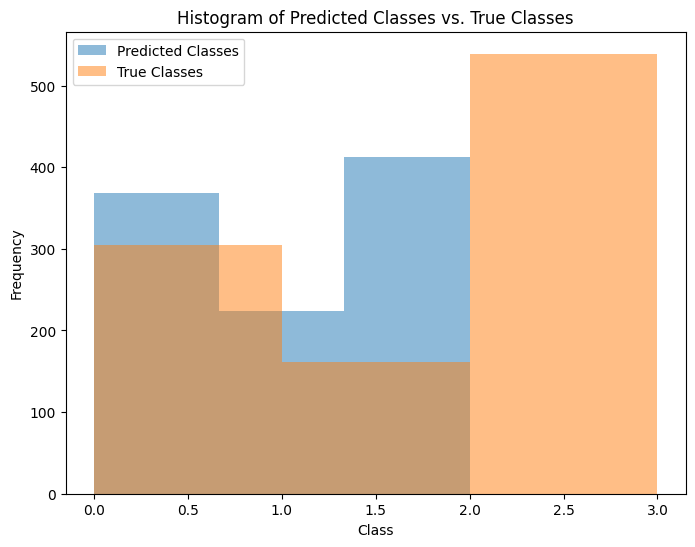

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(predicted_classes, bins=3, alpha=0.5, label='Predicted Classes')
plt.hist(Y_test_15, bins=3, alpha=0.5, label='True Classes')
plt.title('Histogram of Predicted Classes vs. True Classes')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.legend()
plt.show()


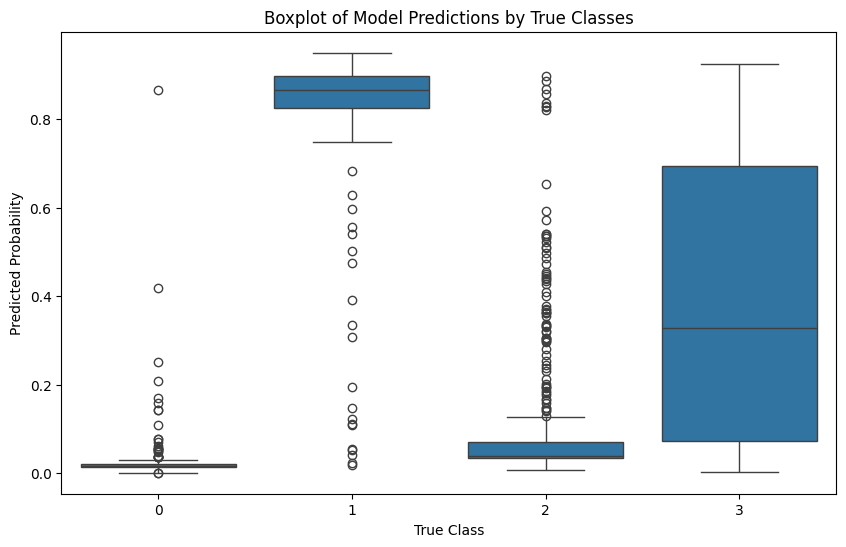

In [ ]:
import seaborn as sns

# Create a DataFrame with true classes and predicted probabilities
pred_df = pd.DataFrame({'True Class': Y_test_15, 'Predicted Probability': Y_pred_15[:, 1]})  # Assuming binary classification

# Plot a boxplot of predicted probabilities by true classes
plt.figure(figsize=(10, 6))
sns.boxplot(x='True Class', y='Predicted Probability', data=pred_df)
plt.title('Boxplot of Model Predictions by True Classes')
plt.xlabel('True Class')
plt.ylabel('Predicted Probability')
plt.show()


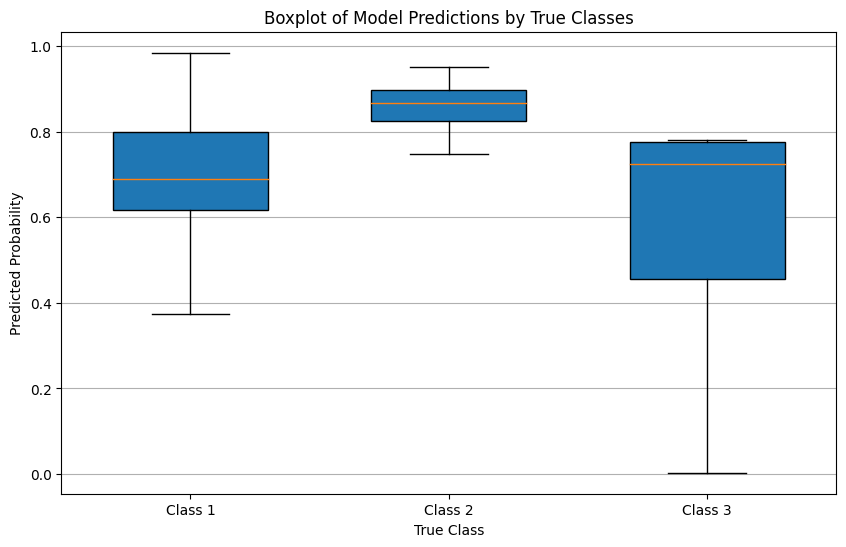

In [ ]:
import matplotlib.pyplot as plt

# Plot boxplots for each true class
plt.figure(figsize=(10, 6))
for true_class in range(3):  # Assuming 3 classes
    class_indices = np.where(Y_test_15 == true_class)[0]
    class_pred_probs = Y_pred_15[class_indices, true_class]
    plt.boxplot(class_pred_probs, positions=[true_class], widths=0.6, showfliers=False, patch_artist=True)

# Add labels and title
plt.title('Boxplot of Model Predictions by True Classes')
plt.xlabel('True Class')
plt.ylabel('Predicted Probability')
plt.xticks(range(3), labels=['Class 1', 'Class 2', 'Class 3'])
plt.grid(axis='y')
plt.show()


In [ ]:
from matplotlib import pyplot as plt
misclassified_data['True Class'].plot(kind='hist', bins=20, title='True Class')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
from matplotlib import pyplot as plt
misclassified_data['True Class'].plot(kind='hist', bins=20, title='True Class')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
from matplotlib import pyplot as plt
misclassified_data['True Class'].plot(kind='hist', bins=20, title='True Class')
plt.gca().spines[['top', 'right',]].set_visible(False)

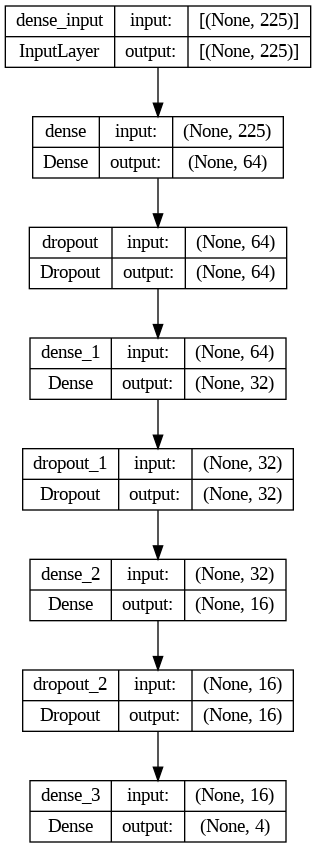

In [ ]:
from tensorflow.keras.utils import plot_model

# Save the visualization of the model architecture to a file
plot_model(dnn_model_15, to_file='dnn_model_structure.png', show_shapes=True, show_layer_names=True)


This variation includes Batch Normalization layers after each dense layer. Batch Normalization helps stabilize and speed up the training of deep neural networks by normalizing the activations of each layer. Additionally, Dropout layers are added after each dense layer to prevent overfitting.

This architecture starts with an input layer, followed by multiple dense layers with ReLU activation functions, dropout, and batch normalization. Finally, the output layer with softmax activation is added for multi-class classification.

Adjusting the number of neurons and layers, as well as the dropout rate and other hyperparameters, may be necessary depending on the specifics of your dataset and problem. Experimentation and tuning are essential to find the optimal architecture for your task.

# 3 Class Mapping: To create a DNN model that trains the labels 'COH' and 'NROI' to class 1, 'CL' to class 2, and 'COL' to class 3

In [ ]:
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, BatchNormalization, Dropout
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
from keras.utils import to_categorical

# Load the data
df_15 = pd.read_csv("/content/15x15_data (3).csv")

# Adjust class labels
df_15['Class'] = df_15['Class'].apply(lambda x: 0 if x <= 1 else x - 1)

# Split the data into train and test sets
train_df_15 = pd.concat([df_15[df_15["Day"] <= 1095], df_15[(df_15["Day"] > 1460) & (df_15["Day"] <= 2555)]])
test_df_15 = pd.concat([df_15[(df_15["Day"] > 1095) & (df_15["Day"] <= 1460)], df_15[(df_15["Day"] > 2555) & (df_15["Day"] <= 2920)]])
test_df_15.reset_index(drop=True, inplace=True)

# Prepare train and test data
X_train_15 = train_df_15.drop(columns=[ "Name", "Day", "Class", "Label"]).values
Y_train_15 = train_df_15["Class"].values

X_test_15 = test_df_15.drop(columns=["Name", "Day", "Class", "Label"]).values
Y_test_15 = test_df_15["Class"].values

# Convert labels to one-hot encoding with 3 classes
Y_train_15 = to_categorical(Y_train_15, num_classes=3)
Y_test_15 = to_categorical(Y_test_15, num_classes=3)

# Define the model architecture
dnn_model_15 = Sequential()
dnn_model_15.add(Dense(128, activation="relu", input_shape=(X_train_15.shape[1],)))
dnn_model_15.add(BatchNormalization())
dnn_model_15.add(Dropout(0.5))

dnn_model_15.add(Dense(64, activation="relu"))
dnn_model_15.add(BatchNormalization())
dnn_model_15.add(Dropout(0.5))

dnn_model_15.add(Dense(32, activation="relu"))
dnn_model_15.add(BatchNormalization())
dnn_model_15.add(Dropout(0.5))

dnn_model_15.add(Dense(16, activation="relu"))
dnn_model_15.add(BatchNormalization())
dnn_model_15.add(Dropout(0.5))

# Output layer with 3 neurons for 3 classes
dnn_model_15.add(Dense(3, activation="softmax"))

# Compile the model
optimizer = Adam(lr=0.001)
dnn_model_15.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Define early stopping callback
early_stopping_callback = EarlyStopping(patience=10, restore_best_weights=True)

# Train the model
history = dnn_model_15.fit(X_train_15, Y_train_15, epochs=1000, batch_size=16, validation_data=(X_test_15, Y_test_15), callbacks=[early_stopping_callback])


Epoch 1/1000
26/26 [==============================] - 4s 22ms/step - loss: 1.7028 - accuracy: 0.3881 - val_loss: 1.1707 - val_accuracy: 0.2293
Epoch 2/1000
26/26 [==============================] - 0s 7ms/step - loss: 1.6032 - accuracy: 0.4279 - val_loss: 1.0555 - val_accuracy: 0.4522
Epoch 3/1000
26/26 [==============================] - 0s 8ms/step - loss: 1.3530 - accuracy: 0.4751 - val_loss: 1.0459 - val_accuracy: 0.4522
Epoch 4/1000
26/26 [==============================] - 0s 9ms/step - loss: 1.3523 - accuracy: 0.4552 - val_loss: 1.0267 - val_accuracy: 0.4522
Epoch 5/1000
26/26 [==============================] - 0s 8ms/step - loss: 1.3640 - accuracy: 0.4627 - val_loss: 1.0400 - val_accuracy: 0.5064
Epoch 6/1000
26/26 [==============================] - 0s 7ms/step - loss: 1.2602 - accuracy: 0.4701 - val_loss: 1.0845 - val_accuracy: 0.5382
Epoch 7/1000
26/26 [==============================] - 0s 7ms/step - loss: 1.1765 - accuracy: 0.5249 - val_loss: 0.9528 - val_accuracy: 0.3535
Epoch

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict classes on the test set
Y_pred_15 = dnn_model_15.predict(X_test_15)
# Convert predicted classes to one-hot encoding
Y_pred_classes_15 = np.argmax(Y_pred_15, axis=1)
# Convert true classes to one-hot encoding
Y_true_classes_15 = np.argmax(Y_test_15, axis=1)

# Generate confusion matrix
conf_matrix = confusion_matrix(Y_true_classes_15, Y_pred_classes_15)

print("Confusion Matrix:")
print(conf_matrix)


10/10 [==============================] - 0s 3ms/step
Confusion Matrix:
[[129  30   0]
 [ 25 117   0]
 [  3  10   0]]
